In [1]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import AdaBoostClassifier
from sklearn.preprocessing import OrdinalEncoder
from scipy import stats
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
from sklearn.metrics import f1_score
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import learning_curve
from sklearn.metrics import f1_score, make_scorer
from sklearn.neural_network import MLPClassifier
####clean up data set 1: the adult earning prediction dataset 

data_1=pd.read_csv('adult.data', header=None, names=['age','workclass','fnlwgt','education','education-num','marital-status','occupation','relationship','race','sex','capital-gain','capital-loss','hours-per-week','native-country','50K'], sep=',\s', na_values=["?"])
data_2=pd.read_csv('adult.test', header=None, names=['age','workclass','fnlwgt','education','education-num','marital-status','occupation','relationship','race','sex','capital-gain','capital-loss','hours-per-week','native-country','50K'], sep=',\s', na_values=["?"])

adult_df = pd.concat([data_1,data_2])

###clean all missing data, just delect all of those 
adult_df.replace(' ?',np.NaN,inplace=True)
adult_df=adult_df.dropna()
adult_df.replace('>50K.', '>',inplace=True)
adult_df.replace('<=50K.', '<=',inplace=True)
adult_df.replace('>50K', '>',inplace=True)
adult_df.replace('<=50K', '<=',inplace=True)

##normalize

adult_label_col =['workclass','education','marital-status','occupation','relationship','race','sex','native-country','50K']
adult_df[adult_label_col] = adult_df[adult_label_col].astype('category')
adult_df[adult_label_col] = adult_df[adult_label_col].apply(lambda x: x.cat.codes)


scaler = StandardScaler()
num_label = ['age','education-num','capital-gain','capital-loss','hours-per-week']
adult_df[num_label] = scaler.fit_transform(adult_df[num_label] )
#print(adult_df['hours-per-week'].std())
X_adult, y_adult = adult_df.loc[:, adult_df.columns != '50K'],adult_df['50K']

X_train_adult, X_test_adult, y_train_adult, y_test_adult = train_test_split(X_adult, y_adult, test_size=0.2, random_state=33)

#######load dataset 2: beans !!!!
bean_df = pd.read_excel('./DryBeanDataset/Dry_Bean_Dataset.xlsx')
X_bean, y_bean = bean_df.loc[:, bean_df.columns != 'Class'],bean_df['Class']
bean_num_col = []
for col in X_bean.columns:
    bean_num_col.append(col)
X_bean[bean_num_col] = scaler.fit_transform(X_bean[bean_num_col])
X_train_bean, X_test_bean, y_train_bean, y_test_bean = train_test_split(X_bean, y_bean, test_size=0.2, random_state=33)


######
###remove beans synthetic part:
#bean_df.loc[:,[i for i in list(bean_df.columns) if i not in ['Class','ShapeFactor1','ShapeFactor2','ShapeFactor3','ShapeFactor4']]]
X_train_bean_pure, X_test_bean_pure = X_train_bean.loc[:,[i for i in list(X_train_bean.columns) if i not in ['ShapeFactor1','ShapeFactor2','ShapeFactor3','ShapeFactor4','AspectRation','EquivDiameter','Solidity','roundness','Compactness']]],X_test_bean.loc[:,[i for i in list(X_train_bean.columns) if i not in ['ShapeFactor1','ShapeFactor2','ShapeFactor3','ShapeFactor4','AspectRation','EquivDiameter','Solidity','roundness','Compactness']]]

/tmp/ipykernel_261930/3462693255.py:16: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support regex separators (separators > 1 char and different from '\s+' are interpreted as regex); you can avoid this warning by specifying engine='python'.
  data_1=pd.read_csv('adult.data', header=None, names=['age','workclass','fnlwgt','education','education-num','marital-status','occupation','relationship','race','sex','capital-gain','capital-loss','hours-per-week','native-country','50K'], sep=',\s', na_values=["?"])
/tmp/ipykernel_261930/3462693255.py:17: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support regex separators (separators > 1 char and different from '\s+' are interpreted as regex); you can avoid this warning by specifying engine='python'.
  data_2=pd.read_csv('adult.test', header=None, names=['age','workclass','fnlwgt','education','education-num','marital-status','occupation','relationship','race','sex','capit

In [100]:
####beans dataset
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeClassifier

clf = DecisionTreeClassifier(random_state=0)
path = clf.cost_complexity_pruning_path(X_train_bean, y_train_bean)
ccp_alphas, impurities = path.ccp_alphas, path.impurities

In [99]:
####beans dataset pure
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeClassifier

clf = DecisionTreeClassifier(random_state=0)
path = clf.cost_complexity_pruning_path(X_train_bean_pure, y_train_bean)
ccp_alphas, impurities = path.ccp_alphas, path.impurities

In [102]:
####figure out which criterion to used for adult 


Best parameters found:
 {'criterion': 'entropy'}
0.806 (+/-0.007) for {'criterion': 'gini'}
0.810 (+/-0.005) for {'criterion': 'entropy'}
0.810 (+/-0.005) for {'criterion': 'log_loss'}
[0.12052846 0.14220748 0.12037325] mean_fit time


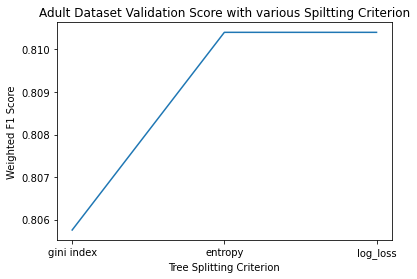

Text(0, 0.5, 'Training Time(s)')

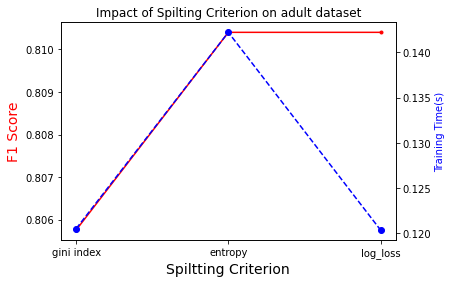

In [104]:

from asyncio import constants
from sklearn.metrics import f1_score, make_scorer
clf = DecisionTreeClassifier(random_state=0)
parameter_space = {
   'criterion': ['gini', 'entropy','log_loss']
}

from sklearn.model_selection import GridSearchCV
f1_scorer = make_scorer(f1_score,average='weighted')
clf = GridSearchCV(clf, parameter_space, n_jobs=-1, cv=5,scoring=f1_scorer)
clf.fit(X_train_adult, y_train_adult)
# Best paramete set
print('Best parameters found:\n', clf.best_params_)

# All results
#print(clf.cv_results_)
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
fit_time =clf.cv_results_['mean_fit_time']
pred_time = clf.cv_results_['mean_score_time']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std * 2, params))


print(clf.cv_results_['mean_fit_time'], 'mean_fit time')
plt.plot([1,2,3],means,label='Cross Validation Score')
#plt.plot([1,2,3],clf.cv_results_('mean_fit_time'),label='Mean Train Time')

ticker= ['gini index', 'entropy','log_loss']
plt.xticks([1,2,3],ticker)
plt.ylabel('Weighted F1 Score')
plt.xlabel('Tree Splitting Criterion')
plt.title('Adult Dataset Validation Score with various Spiltting Criterion')
plt.show()

fig,ax = plt.subplots()
ax.plot([1,2,3],means,label='Cross Validation Score',color='red',marker='.')
ax.set_xticks([1,2,3],ticker)
# set x-axis label
ax.set_xlabel("Spiltting Criterion", fontsize = 14)
# set y-axis label
ax.set_ylabel("F1 Score",
              color="red",
              fontsize=14)
ax.set_title('Impact of Spilting Criterion on adult dataset')
ax2=ax.twinx()
ax2.plot([1,2,3],fit_time,label='Average Fitting Time',color='blue',marker='o',linestyle ='dashed')
#ax2.plot([1,2,3],pred_time,label='Average Prediction Time')
ax2.set_ylabel('Training Time(s)',color='blue')



Text(0.5, 1.0, 'Total Impurity vs effective alpha for training set')

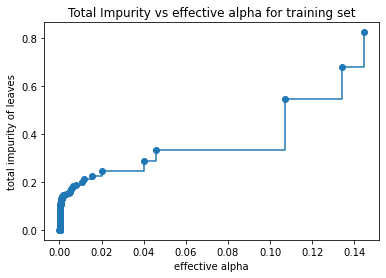

In [25]:
fig, ax = plt.subplots()
ax.plot(ccp_alphas[:], impurities[:], marker="o", drawstyle="steps-post")
ax.set_xlabel("effective alpha")
ax.set_ylabel("total impurity of leaves")
ax.set_title("Total Impurity vs effective alpha for training set")

Text(0.5, 1.0, 'Total Impurity vs effective alpha for training set')

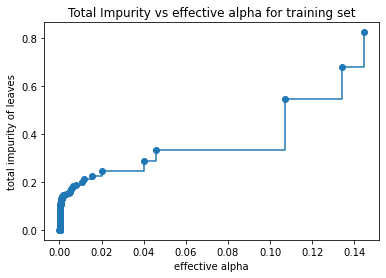

In [97]:
fig, ax = plt.subplots()
ax.plot(ccp_alphas[:], impurities[:], marker="o", drawstyle="steps-post")
ax.set_xlabel("effective alpha")
ax.set_ylabel("total impurity of leaves")
ax.set_title("Total Impurity vs effective alpha for training set")

In [105]:
#####generate cv plot for different ccp alpha for the whole bean feature 

from sklearn.model_selection import cross_validate
alpha_cv_result = []
for ccp_alpha in ccp_alphas:
    clf = DecisionTreeClassifier(random_state=0, ccp_alpha=ccp_alpha)
    scores = cross_validate(clf,X_train_bean,y_train_bean,cv=5,scoring='f1_weighted',return_train_score=True)
    alpha_cv_result.append(scores)

alpha_cv_score = alpha_cv_result[:-1]
ccp_alphas = ccp_alphas[:-1]


KeyboardInterrupt: 

In [7]:
#####generate cv plot for different ccp alpha for the whole bean feature 

from sklearn.model_selection import cross_validate
alpha_cv_result = []
for ccp_alpha in ccp_alphas:
    clf = DecisionTreeClassifier(random_state=0, ccp_alpha=ccp_alpha)
    scores = cross_validate(clf,X_train_bean_pure,y_train_bean,cv=5,scoring='f1_weighted',return_train_score=True)
    alpha_cv_result.append(scores)

alpha_cv_score = alpha_cv_result[:-1]
ccp_alphas = ccp_alphas[:-1]

Best parameters found:
 {'criterion': 'entropy'}
0.892 (+/-0.011) for {'criterion': 'gini'}
0.894 (+/-0.015) for {'criterion': 'entropy'}
0.894 (+/-0.015) for {'criterion': 'log_loss'}
[0.14578047 0.16051478 0.20291791] mean_fit time


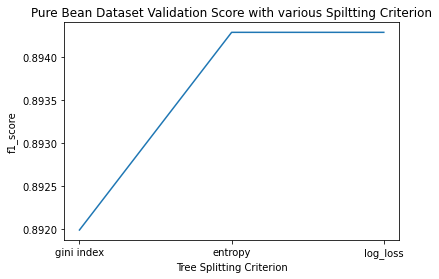

Text(0, 0.5, 'Training Time(s)')

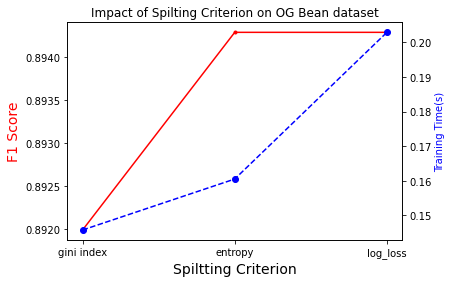

In [8]:
####figure out which criterion to used for beans set

from asyncio import constants
from sklearn.metrics import f1_score, make_scorer
clf = DecisionTreeClassifier(random_state=0)
parameter_space = {
   'criterion': ['gini', 'entropy','log_loss']
}

from sklearn.model_selection import GridSearchCV
f1_scorer = make_scorer(f1_score,average='weighted')
clf = GridSearchCV(clf, parameter_space, n_jobs=-1, cv=5,scoring=f1_scorer)
clf.fit(X_train_bean, y_train_bean)
# Best paramete set 
print('Best parameters found:\n', clf.best_params_)

# All results
#print(clf.cv_results_)
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
fit_time =clf.cv_results_['mean_fit_time']
pred_time = clf.cv_results_['mean_score_time']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std * 2, params))


print(clf.cv_results_['mean_fit_time'], 'mean_fit time')
plt.plot([1,2,3],means,label='Cross Validation Score')
#plt.plot([1,2,3],clf.cv_results_('mean_fit_time'),label='Mean Train Time')

ticker= ['gini index', 'entropy','log_loss']
plt.xticks([1,2,3],ticker)
plt.ylabel('f1_score')
plt.xlabel('Tree Splitting Criterion')
plt.title('Pure Bean Dataset Validation Score with various Spiltting Criterion')
plt.show()

fig,ax = plt.subplots()
ax.plot([1,2,3],means,label='Cross Validation Score',color='red',marker='.')
ax.set_xticks([1,2,3],ticker)
# set x-axis label
ax.set_xlabel("Spiltting Criterion", fontsize = 14)
# set y-axis label
ax.set_ylabel("F1 Score",
              color="red",
              fontsize=14)
ax.set_title('Impact of Spilting Criterion on OG Bean dataset')
ax2=ax.twinx()
ax2.plot([1,2,3],fit_time,label='Average Fitting Time',color='blue',marker='o',linestyle ='dashed')
#ax2.plot([1,2,3],pred_time,label='Average Prediction Time')
ax2.set_ylabel('Training Time(s)',color='blue')


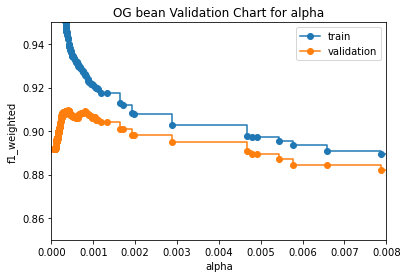

357
The best validation score happened at alpha=0.00038395991509510973


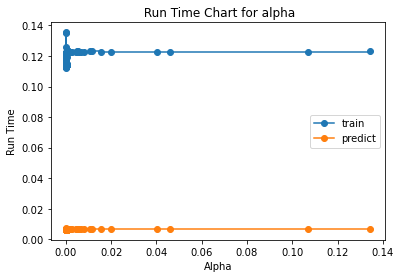

In [31]:
###for bean og 


train_score = []
validate_score = []
train_time = []
score_time = []
for result in alpha_cv_result:
    train_score.append(np.average(result['train_score']))
    validate_score.append(np.average(result['test_score']))
    train_time.append(np.average(result['fit_time']))
    score_time.append(np.average(result['score_time']))
fig, ax = plt.subplots()
ax.set_xlabel("alpha")
ax.set_ylabel("f1_weighted")
ax.set_title("OG bean Validation Chart for alpha")
#ax.set_xlim(left=0,right=0.001)
ax.plot(ccp_alphas, train_score[:-1], marker="o", label="train", drawstyle="steps-post")
ax.plot(ccp_alphas, validate_score[:-1], marker="o", label="validation", drawstyle="steps-post")
ax.legend()
ax.set_xlim(left=0,right=0.008)
ax.set_ylim(bottom=0.85,top=0.95)
plt.show()
print(validate_score.index(max(validate_score)))
print('The best validation score happened at alpha=' + str(ccp_alphas[validate_score.index(max(validate_score))]))


fig, ax2 = plt.subplots()
ax2.set_xlabel("Alpha")
ax2.set_ylabel("Run Time")
ax2.set_title(" Run Time Chart for alpha")
#ax.set_xlim(left=0,right=0.001)
ax2.plot(ccp_alphas, train_time[:-1], marker="o", label="train", drawstyle="steps-post")
ax2.plot(ccp_alphas, score_time[:-1], marker="o", label="predict", drawstyle="steps-post")
ax2.legend()
plt.show()


In [33]:
print(0.0013238942)

0.0013238942


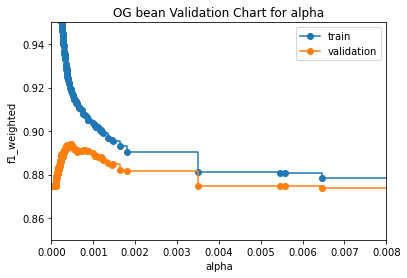

423
The best validation score happened at alpha=0.0004659938366323561


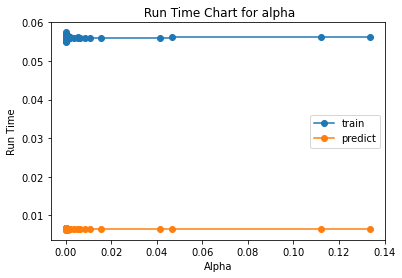

In [9]:
###for bean pure set


train_score = []
validate_score = []
train_time = []
score_time = []
for result in alpha_cv_result:
    train_score.append(np.average(result['train_score']))
    validate_score.append(np.average(result['test_score']))
    train_time.append(np.average(result['fit_time']))
    score_time.append(np.average(result['score_time']))
fig, ax = plt.subplots()
ax.set_xlabel("alpha")
ax.set_ylabel("f1_weighted")
ax.set_title("Pure Bean Validation Chart for alpha")
#ax.set_xlim(left=0,right=0.001)
ax.plot(ccp_alphas, train_score[:-1], marker="o", label="train", drawstyle="steps-post")
ax.plot(ccp_alphas, validate_score[:-1], marker="o", label="validation", drawstyle="steps-post")
ax.legend()
ax.set_xlim(left=0,right=0.008)
ax.set_ylim(bottom=0.85,top=0.95)
plt.show()
print(validate_score.index(max(validate_score)))
print('The best validation score happened at alpha=' + str(ccp_alphas[validate_score.index(max(validate_score))]))


fig, ax2 = plt.subplots()
ax2.set_xlabel("Alpha")
ax2.set_ylabel("Run Time")
ax2.set_title(" Run Time Chart for alpha")
#ax.set_xlim(left=0,right=0.001)
ax2.plot(ccp_alphas, train_time[:-1], marker="o", label="train", drawstyle="steps-post")
ax2.plot(ccp_alphas, score_time[:-1], marker="o", label="predict", drawstyle="steps-post")
ax2.legend()
plt.show()

The f1 micro score is 0.9092406809296956


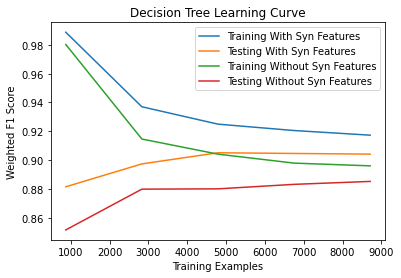

In [122]:
####bean learning curve
from sklearn.model_selection import learning_curve
clf = DecisionTreeClassifier(random_state=0,ccp_alpha=0.0013238942,criterion='gini')
train_sizes, train_scores, test_scores, fit_times, _ = learning_curve(clf, X_train_bean, y_train_bean, cv=5,return_times=True,scoring='f1_weighted')

plt.plot(train_sizes,np.mean(train_scores,axis=1),label='Training With Syn Features')
plt.plot(train_sizes,np.mean(test_scores,axis=1),label='Testing With Syn Features')
clf = DecisionTreeClassifier(random_state=0,ccp_alpha=0.0013238942,criterion='gini')
train_sizes, train_scores, test_scores, fit_times, _ = learning_curve(clf, X_train_bean_pure, y_train_bean, cv=5,return_times=True,scoring='f1_weighted')
plt.plot(train_sizes,np.mean(train_scores,axis=1),label='Training Without Syn Features')
plt.plot(train_sizes,np.mean(test_scores,axis=1),label='Testing Without Syn Features')
plt.title('Decision Tree Learning Curve')
plt.xlabel('Training Examples')
plt.ylabel('Weighted F1 Score')
plt.legend()
clf.fit(X_train_bean, y_train_bean)
pred_test_bean = clf.predict(X_test_bean)
print('The f1 micro score is ' + str(f1_score(y_test_bean,pred_test_bean,average='weighted')))

In [96]:
clf = DecisionTreeClassifier(random_state=0,ccp_alpha=0.0013238942,criterion='gini')

In [97]:
clf.fit(X_train_bean, y_train_bean)

DecisionTreeClassifier(ccp_alpha=0.0013238942, random_state=0)

In [94]:
clf.predict(X_test_bean)

array(['SEKER', 'BOMBAY', 'BOMBAY', ..., 'BARBUNYA', 'HOROZ', 'BARBUNYA'],
      dtype=object)

In [95]:
pred_test_bean = clf.predict(X_test_bean)
print('The test f1 score is ' + str(f1_score(y_test_bean,pred_test_bean,average='weighted')))
pred_test_bean = clf.predict(X_train_bean)
print('The train f1 score is ' + str(f1_score(y_train_bean,pred_train_bean,average='weighted')))

The test f1 score is 0.9092406809296956
The train f1 score is 0.9359695304160706


The f1 micro score is 0.8849237524726911


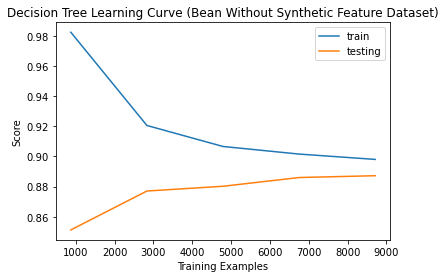

In [49]:
####bean learning curve pure
from cProfile import label
from sklearn.model_selection import learning_curve
clf = DecisionTreeClassifier(random_state=0,ccp_alpha=0.0012,criterion='gini')
train_sizes, train_scores, test_scores, fit_times, _ = learning_curve(clf, X_train_bean_pure, y_train_bean, cv=5,return_times=True,scoring='f1_weighted')

plt.plot(train_sizes,np.mean(train_scores,axis=1),label='train')
plt.plot(train_sizes,np.mean(test_scores,axis=1),label='testing')
plt.title('Decision Tree Learning Curve (Bean Without Synthetic Feature Dataset)')
plt.xlabel('Training Examples')
plt.ylabel('Score')
plt.legend()
clf.fit(X_train_bean_pure, y_train_bean)
pred_test_bean = clf.predict(X_test_bean_pure)
print('The f1 micro score is ' + str(f1_score(y_test_bean,pred_test_bean,average='weighted')))

In [81]:
####beans dataset without all syn feature
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeClassifier

clf = DecisionTreeClassifier(random_state=0)
path = clf.cost_complexity_pruning_path(X_train_bean_pure, y_train_bean)
ccp_alphas, impurities = path.ccp_alphas, path.impurities

Text(0.5, 1.0, 'Total Impurity vs effective alpha for training set')

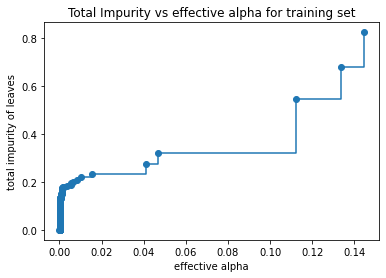

In [82]:
fig, ax = plt.subplots()
ax.plot(ccp_alphas[:], impurities[:], marker="o", drawstyle="steps-post")
ax.set_xlabel("effective alpha")
ax.set_ylabel("total impurity of leaves")
ax.set_title("Total Impurity vs effective alpha for training set")

In [83]:
####generate cv plot for different ccp alpha

from sklearn.model_selection import cross_validate
alpha_cv_result = []
for ccp_alpha in ccp_alphas:
    clf = DecisionTreeClassifier(random_state=0, ccp_alpha=ccp_alpha)
    scores = cross_validate(clf,X_train_bean_pure,y_train_bean,cv=5,scoring='f1_micro',return_train_score=True)
    alpha_cv_result.append(scores)

alpha_cv_score = alpha_cv_result[:-1]
ccp_alphas = ccp_alphas[:-1]

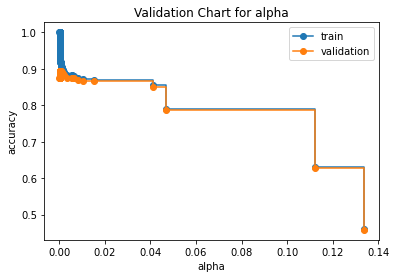

423
The best validation score happened at alpha=0.0004659938366323561


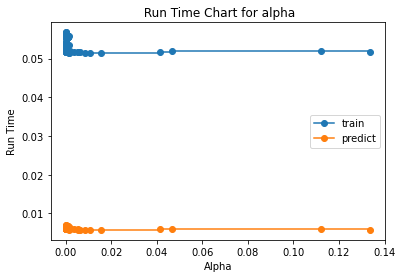

In [85]:
train_score = []
validate_score = []
train_time = []
score_time = []
for result in alpha_cv_result:
    train_score.append(np.average(result['train_score']))
    validate_score.append(np.average(result['test_score']))
    train_time.append(np.average(result['fit_time']))
    score_time.append(np.average(result['score_time']))

    
fig, ax = plt.subplots(1)
ax.set_xlabel("alpha")
ax.set_ylabel("accuracy")
ax.set_title("Validation Chart for alpha")
#ax.set_xlim(left=0,right=0.001)
ax.plot(ccp_alphas, train_score[:-1], marker="o", label="train", drawstyle="steps-post")
ax.plot(ccp_alphas, validate_score[:-1], marker="o", label="validation", drawstyle="steps-post")
ax.legend()
plt.show()
print(validate_score.index(max(validate_score)))
print('The best validation score happened at alpha=' + str(ccp_alphas[validate_score.index(max(validate_score))]))

fig, ax2 = plt.subplots()
ax2.set_xlabel("Alpha")
ax2.set_ylabel("Run Time")
ax2.set_title(" Run Time Chart for alpha")
#ax.set_xlim(left=0,right=0.001)
ax2.plot(ccp_alphas, train_time[:-1], marker="o", label="train", drawstyle="steps-post")
ax2.plot(ccp_alphas, score_time[:-1], marker="o", label="predict", drawstyle="steps-post")
ax2.legend()
plt.show()

The f1 micro score is 0.8964377524788836


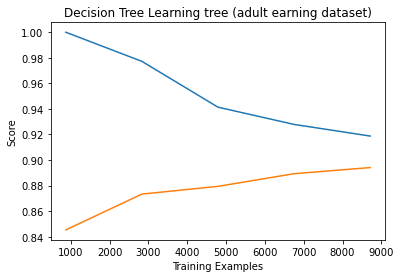

In [2]:
####pure bean learning curve
from sklearn.model_selection import learning_curve
from sklearn.metrics import f1_score
from sklearn.tree import DecisionTreeClassifier
clf = DecisionTreeClassifier(random_state=0,ccp_alpha=0.0004659938366323561,criterion='gini')
train_sizes, train_scores, test_scores, fit_times, _ = learning_curve(clf, X_train_bean_pure, y_train_bean, cv=5,return_times=True,scoring='f1_micro')

plt.plot(train_sizes,np.mean(train_scores,axis=1))
plt.plot(train_sizes,np.mean(test_scores,axis=1))
plt.title('Decision Tree Learning tree (adult earning dataset)')
plt.xlabel('Training Examples')
plt.ylabel('Score')
plt.legend()
clf.fit(X_train_bean_pure, y_train_bean)
pred_test_bean_pure = clf.predict(X_test_bean_pure)
print('The f1 micro score is ' + str(f1_score(y_test_bean,pred_test_bean_pure,average='micro')))


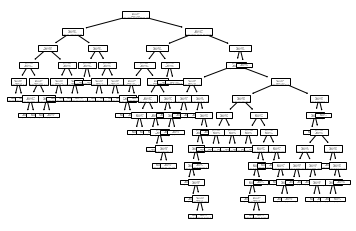

In [10]:
from sklearn import tree

tree.plot_tree(clf)
plt.show()

fig = plt.figure(figsize=(50,50),dpi=400)
_ = tree.plot_tree(clf, 
                   filled=True)

In [149]:
from sklearn.model_selection import cross_val_score
clfs = []
for ccp_alpha in ccp_alphas:
    clf = DecisionTreeClassifier(random_state=0, ccp_alpha=ccp_alpha,critertion='entropy')
    clf.fit(X_train_adult, y_train_adult)
    clfs.append(clf)
print(
    "Number of nodes in the last tree is: {} with ccp_alpha: {}".format(
        clfs[-1].tree_.node_count, ccp_alphas[-1]
    )
)

Number of nodes in the last tree is: 1 with ccp_alpha: 0.13433854672956305


In [106]:
#####generate cv plot for different ccp alphaa adult dataset

from sklearn.model_selection import cross_validate
alpha_cv_result = []
for ccp_alpha in ccp_alphas:
    clf = DecisionTreeClassifier(random_state=0, ccp_alpha=ccp_alpha,criterion='entropy')
    scores = cross_validate(clf,X_train_adult,y_train_adult,cv=5,scoring='f1_weighted',return_train_score=True)
    alpha_cv_result.append(scores)

alpha_cv_score = alpha_cv_result[:-1]
ccp_alphas = ccp_alphas[:-1]


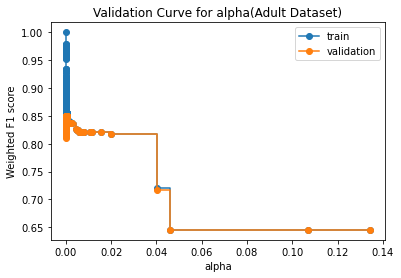

330
0.8501660038637237
The best validation score happened at alpha=0.00028414966112210555


In [107]:
train_score = []
validate_score = []
for result in alpha_cv_result:
    train_score.append(np.average(result['train_score']))
    validate_score.append(np.average(result['test_score']))

fig, ax = plt.subplots()
ax.set_xlabel("alpha")
ax.set_ylabel("Weighted F1 score")
ax.set_title("Validation Curve for alpha(Adult Dataset)")
#ax.set_xlim(left=0,right=0.0005)
ax.plot(ccp_alphas, train_score[:-1], marker="o", label="train", drawstyle="steps-post")
ax.plot(ccp_alphas, validate_score[:-1], marker="o", label="validation", drawstyle="steps-post")
ax.legend()
plt.show()
print(validate_score.index(max(validate_score)))
print(max(validate_score))
print('The best validation score happened at alpha=' + str(ccp_alphas[validate_score.index(max(validate_score))]))


Text(0, 0.5, 'Score')

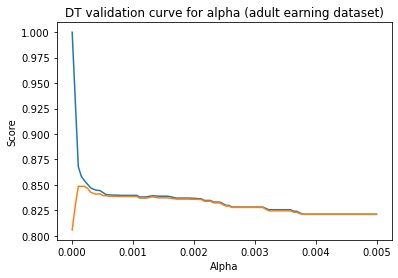

In [110]:
from sklearn.model_selection import validation_curve
train_scores, valid_scores = validation_curve(
     DecisionTreeClassifier(random_state=0), X_train_adult, y_train_adult, param_name='ccp_alpha', param_range=np.linspace(0,0.005,num=100),scoring='f1_weighted',
     cv=5)

plt.plot(np.linspace(0,0.005,num=100),np.mean(train_scores,axis=1),label='training score')
plt.plot(np.linspace(0,0.005,num=100),np.mean(valid_scores,axis=1),label='testing score')
plt.title('DT validation curve for alpha (adult earning dataset)')
plt.xlabel('Alpha')
plt.ylabel('Score')


Training score


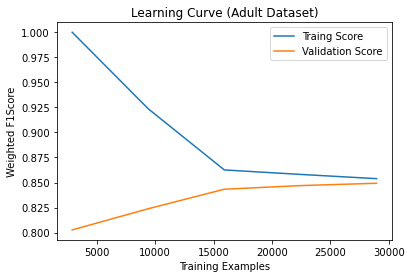

In [112]:
from sklearn.model_selection import learning_curve
clf = DecisionTreeClassifier(random_state=0,ccp_alpha=0.00035716996937863125,criterion='entropy')
train_sizes, train_scores, test_scores, fit_times, _ = learning_curve(clf, X_train_adult, y_train_adult, cv=5,return_times=True,scoring='f1_weighted')

plt.plot(train_sizes,np.mean(train_scores,axis=1),label='Traing Score')
plt.plot(train_sizes,np.mean(test_scores,axis=1),label='Validation Score')
plt.title('Learning Curve (Adult Dataset)')
plt.xlabel('Training Examples')
plt.legend()
plt.ylabel('Weighted F1Score')

print('Training score')


In [113]:
clf = DecisionTreeClassifier(random_state=0,ccp_alpha=0.00035716996937863125,criterion='entropy')

In [114]:
clf.fit(X_train_adult,y_train_adult)
pred_res=clf.predict(X_train_adult)
print(f1_score(y_train_adult,pred_res,average='weighted'))

0.854081648599312


In [115]:
#clf.predict(X_test_adult)
pred_res=clf.predict(X_test_adult)
print(f1_score(y_test_adult,pred_res,average='weighted'))

0.8495441009791116


In [119]:
clf.fit(X_train_adult,y_train_adult)

DecisionTreeClassifier(ccp_alpha=0.00035716996937863125, criterion='entropy',
                       random_state=0)

In [120]:
pred_res=clf.predict(X_test_adult)

In [ ]:
print('f1 score' + )

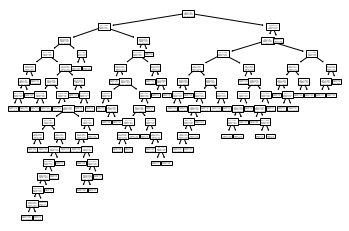

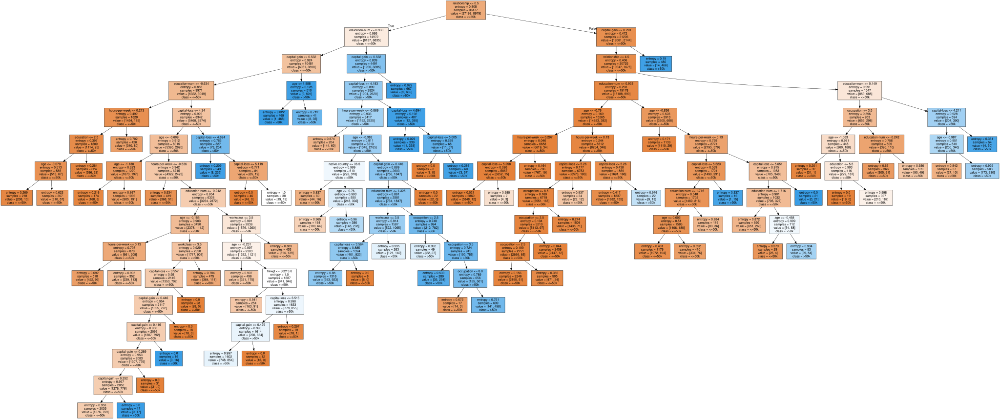

In [17]:
from sklearn import tree
import graphviz
clf.fit(X_train_adult,y_train_adult)
tree.plot_tree(clf)
plt.show()

fig = plt.figure(figsize=(50,50),dpi=400)
_ = tree.plot_tree(clf, 
                   filled=True)

# DOT data
dot_data = tree.export_graphviz(clf, out_file=None, 
                                feature_names=X_train_adult.columns,  
                                class_names=['<=50k',">50k"],
                                filled=True)

# Draw graph
graph = graphviz.Source(dot_data, format="png") 
graph

In [ ]:
KNN

In [ ]:
KNN

In [124]:
####KNN ### adult dataset
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import validation_curve
clf = KNeighborsClassifier()
train_scores, valid_scores = validation_curve(
     KNeighborsClassifier(metric='hamming'), X_train_adult, y_train_adult, param_name='n_neighbors', param_range=[1,10,50,100,500,1000],
     cv=5,scoring="f1_weighted")



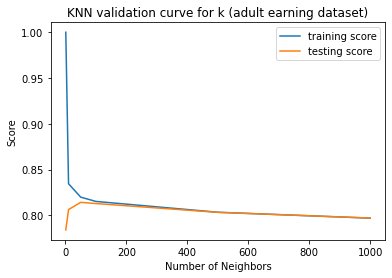

In [37]:
plt.plot([1,10,50,100,500,1000],np.mean(train_scores,axis=1),label='training score')
plt.plot([1,10,50,100,500,1000],np.mean(valid_scores,axis=1),label='testing score')
plt.title('KNN validation curve for k (adult earning dataset)')
plt.xlabel('Number of Neighbors')
plt.ylabel('Score')
plt.legend()

In [46]:
clf = KNeighborsClassifier(n_neighbors=100,metric='hamming')

In [47]:
clf.fit(X_train_adult,y_train_adult)

KNeighborsClassifier(metric='hamming', n_neighbors=100)

In [43]:
test_res=clf.predict(X_test_adult)
#train_res=clf.predict(X_train_adult)


In [44]:
print('Training score is ' + str(f1_score(y_train_adult,train_res,average='weighted')))
print('Testing score is ' + str(f1_score(y_test_adult,test_res,average='weighted')))

Training score is 0.8163469436251662
Testing score is 0.8127943708876896


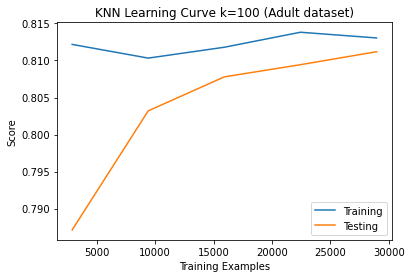

In [125]:
from sklearn.model_selection import learning_curve
clf = KNeighborsClassifier(n_neighbors=100,metric='hamming')
train_sizes, train_scores, test_scores, fit_times, _ = learning_curve(clf, X_train_adult, y_train_adult, cv=5,return_times=True,scoring='f1_weighted')

plt.plot(train_sizes,np.mean(train_scores,axis=1),label='Training')
plt.plot(train_sizes,np.mean(test_scores,axis=1),label='Testing')
plt.title('KNN Learning Curve k=100 (Adult dataset)')
plt.xlabel('Training Examples')
plt.ylabel('Score')
plt.legend()
#clf.fit(X_train_bean, y_train_bean)
#pred_test_bean = clf.predict(X_test_bean)
#print('The f1 micro score is ' + str(f1_score(y_test_bean,pred_test_bean,average='weighted')))

In [51]:
####KNN bean dataset
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import validation_curve
clf = KNeighborsClassifier(p=1)
train_scores, valid_scores = validation_curve(
     KNeighborsClassifier(), X_train_bean, y_train_bean, param_name='n_neighbors', param_range=range(1,1000,10),
     cv=5,scoring="f1_weighted")


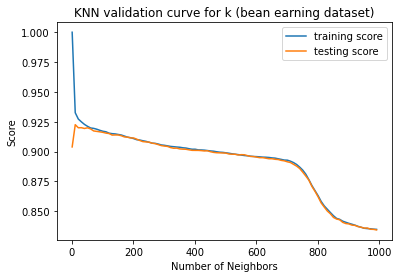

In [52]:
plt.plot(range(1,1000,10),np.mean(train_scores,axis=1),label='training score')
plt.plot(range(1,1000,10),np.mean(valid_scores,axis=1),label='testing score')
plt.title('KNN validation curve for k with manhathan distance(bean earning dataset) ')
plt.xlabel('Number of Neighbors')
plt.ylabel('Score')
plt.legend()

In [4]:
####KNN bean dataset
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import validation_curve
clf = KNeighborsClassifier(p=1)
train_scores, valid_scores = validation_curve(
     KNeighborsClassifier(), X_train_bean_pure, y_train_bean, param_name='n_neighbors', param_range=range(1,1000,10),
     cv=5,scoring="f1_weighted")


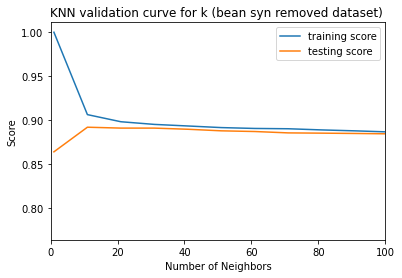

In [6]:
plt.plot(range(1,1000,10),np.mean(train_scores,axis=1),label='training score')
plt.plot(range(1,1000,10),np.mean(valid_scores,axis=1),label='testing score')
plt.xlim(0,100)
plt.title('KNN validation curve for k (bean syn removed dataset) ')
plt.xlabel('Number of Neighbors')
plt.ylabel('Score')
plt.legend()

In [7]:
clf = KNeighborsClassifier(p=1,n_neighbors=30)


In [8]:
clf.fit(X_train_bean,y_train_bean)

KNeighborsClassifier(n_neighbors=30, p=1)

In [10]:
test_res=clf.predict(X_test_bean)
train_res=clf.predict(X_train_bean)
print('Training score is ' + str(f1_score(y_train_bean,train_res,average='weighted')))
print('Testing score is ' + str(f1_score(y_test_bean,test_res,average='weighted')))

Training score is 0.9237085415540047
Testing score is 0.9236712717709777


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


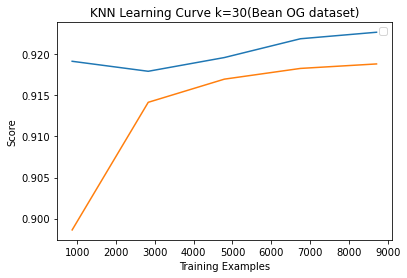

In [11]:
from sklearn.model_selection import learning_curve
clf = KNeighborsClassifier(n_neighbors=30,p=1)
train_sizes, train_scores, test_scores, fit_times, _ = learning_curve(clf, X_train_bean, y_train_bean, cv=5,return_times=True,scoring='f1_weighted')

plt.plot(train_sizes,np.mean(train_scores,axis=1))
plt.plot(train_sizes,np.mean(test_scores,axis=1))
plt.title('KNN Learning Curve k=30(Bean OG dataset)')
plt.xlabel('Training Examples')
plt.ylabel('Score')
plt.legend()
#clf.fit(X_train_bean, y_train_bean)
#pred_test_bean = clf.predict(X_test_bean)
#print('The f1 micro score is ' + str(f1_score(y_test_bean,pred_test_bean,average='weighted')))

In [2]:
####KNN bean dataset
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import validation_curve
clf = KNeighborsClassifier(p=2)
train_scores, valid_scores = validation_curve(
     KNeighborsClassifier(), X_train_bean, y_train_bean, param_name='n_neighbors', param_range=range(1,1000,10),
     cv=5,scoring="f1_weighted")

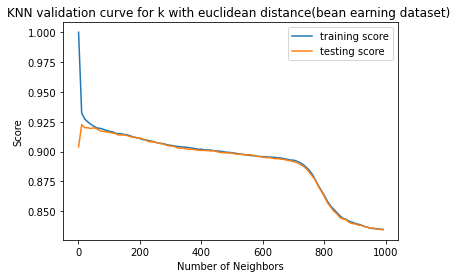

In [3]:
plt.plot(range(1,1000,10),np.mean(train_scores,axis=1),label='training score')
plt.plot(range(1,1000,10),np.mean(valid_scores,axis=1),label='testing score')
plt.title('KNN validation curve for k with euclidean distance(bean earning dataset) ')
plt.xlabel('Number of Neighbors')
plt.ylabel('Score')
plt.legend()

In [ ]:
####KNN bean dataset
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import validation_curve
clf = KNeighborsClassifier()
train_scores, valid_scores = validation_curve(
     KNeighborsClassifier(), X_train_bean_pure, y_train_bean, param_name='n_neighbors', param_range=range(1,200,10),
     cv=5,scoring="f1_weighted")

In [21]:
print(np.mean(valid_scores,axis=1)-np.mean(train_scores,axis=1))

[-0.21578049 -0.09628952 -0.08804279 -0.0569448  -0.0572678  -0.04415929
 -0.04069925 -0.0336313  -0.03402027 -0.02821541 -0.02766129 -0.02325511
 -0.02215171 -0.01857915 -0.01797101 -0.01758355 -0.01640567 -0.01568435
 -0.01525947 -0.01353014 -0.0133215  -0.01165881 -0.01107782 -0.0122971
 -0.01105356 -0.00989685 -0.00969522 -0.00959844 -0.00958189]


In [132]:
clf = KNeighborsClassifier(metric='hamming',n_neighbors=22)

In [133]:
clf.fit(X_train_adult,y_train_adult)

KNeighborsClassifier(metric='hamming', n_neighbors=22)

In [134]:
output_train = clf.predict(X_train_adult)

In [135]:
output_test = clf.predict(X_test_adult)

In [136]:
print('Training score is ' + str(f1_score(y_train_adult,output_train,average='weighted')))
print('Testing score is ' + str(f1_score(y_test_adult,output_test,average='weighted')))


Training score is 0.8266888829910517
Testing score is 0.8166262109991896


In [7]:
clf = KNeighborsClassifier(metric='hamming',n_neighbors=2)
clf.fit(X_train_adult,y_train_adult)
output = clf.predict(X_train_adult)

In [ ]:
###boosting 

In [ ]:
###boosting

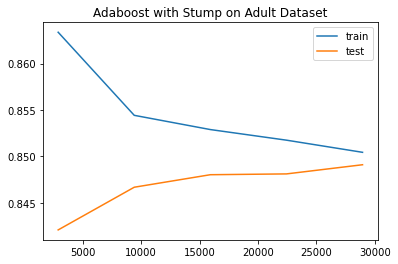

In [19]:
from sklearn.ensemble import AdaBoostClassifier
clf = AdaBoostClassifier(base_estimator=DecisionTreeClassifier(criterion='entropy',max_depth=1))
train_sizes, train_scores, test_scores, fit_times, _ = learning_curve(clf, X_train_adult, y_train_adult, cv=5,return_times=True,scoring='f1_weighted')
plt.plot(train_sizes,np.mean(train_scores,axis=1),label='train')
plt.plot(train_sizes,np.mean(test_scores,axis=1),label='test')
plt.title('Adaboost with Stump on Adult Dataset')
plt.legend()

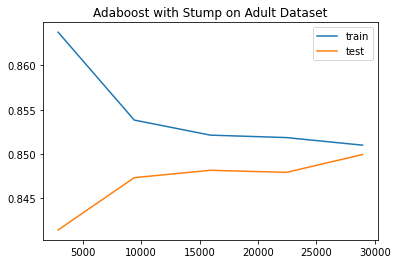

In [20]:
from sklearn.ensemble import AdaBoostClassifier
clf = AdaBoostClassifier(base_estimator=DecisionTreeClassifier(criterion='gini',max_depth=1))
train_sizes, train_scores, test_scores, fit_times, _ = learning_curve(clf, X_train_adult, y_train_adult, cv=5,return_times=True,scoring='f1_weighted')
plt.plot(train_sizes,np.mean(train_scores,axis=1),label='train')
plt.plot(train_sizes,np.mean(test_scores,axis=1),label='test')
plt.title('Adaboost with Stump on Adult Dataset')
plt.legend()

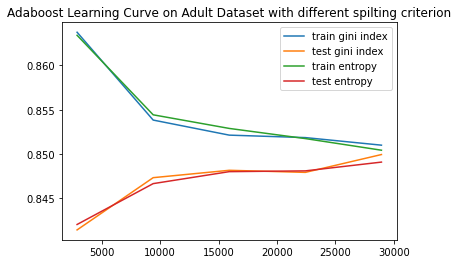

In [22]:
clf = AdaBoostClassifier(base_estimator=DecisionTreeClassifier(criterion='entropy',max_depth=1))
train_sizes_entropy, train_scores_entropy, test_scores_entropy, fit_times_entropy, _ = learning_curve(clf, X_train_adult, y_train_adult, cv=5,return_times=True,scoring='f1_weighted')

plt.plot(train_sizes,np.mean(train_scores,axis=1),label='train gini index')
plt.plot(train_sizes,np.mean(test_scores,axis=1),label='test gini index')
plt.plot(train_sizes,np.mean(train_scores_entropy,axis=1),label='train entropy')
plt.plot(train_sizes,np.mean(test_scores_entropy,axis=1),label='test entropy')
plt.title('Adaboost Learning Curve on Adult Dataset with different spilting criterion')
plt.legend()

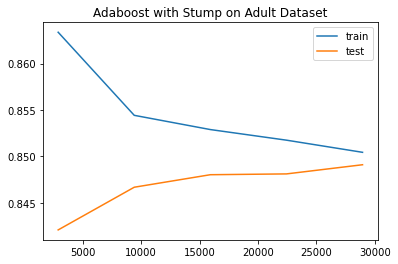

In [18]:
from sklearn.ensemble import AdaBoostClassifier
clf = AdaBoostClassifier(base_estimator=DecisionTreeClassifier(criterion='entropy',splitter='best',max_depth=1))
train_sizes, train_scores, test_scores, fit_times, _ = learning_curve(clf, X_train_adult, y_train_adult, cv=5,return_times=True,scoring='f1_weighted')
plt.plot(train_sizes,np.mean(train_scores,axis=1),label='train')
plt.plot(train_sizes,np.mean(test_scores,axis=1),label='test')
plt.title('Adaboost with Stump on Adult Dataset')
plt.legend()

ValueError: x and y must have same first dimension, but have shapes (10,) and (30,)

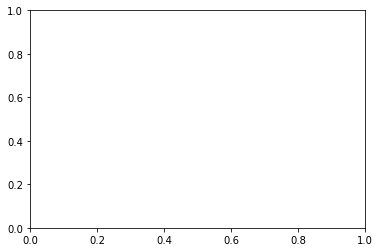

In [25]:
from sklearn.model_selection import validation_curve
train_scores_best, valid_scores_best = validation_curve(
     AdaBoostClassifier(base_estimator=DecisionTreeClassifier(max_depth=1,splitter='best'),random_state=0), X_train_adult, y_train_adult, param_name='n_estimators', param_range=range(1,300,10),
     cv=5,scoring='f1_weighted')
train_scores_random, valid_scores_random = validation_curve(
     AdaBoostClassifier(base_estimator=DecisionTreeClassifier(max_depth=1,splitter='random'),random_state=0), X_train_adult, y_train_adult, param_name='n_estimators', param_range=range(1,300,10),
     cv=5,scoring='f1_weighted')

plt.plot(range(1,100,10),np.mean(train_scores_best,axis=1),label='training score (spillter=best)')
plt.plot(range(1,100,10),np.mean(valid_scores_best,axis=1),label='testing score (spillter=best)')
plt.plot(range(1,100,10),np.mean(train_scores_random,axis=1),label='training score (spillter=random)')
plt.plot(range(1,100,10),np.mean(valid_scores_random,axis=1),label='testing score (spillter=random)')
plt.xlim(0,100)
plt.title('Adaboost Valdation Curve on Spillter and number of esitimators(Adult Dataset)')
plt.xlabel('Number of Trees in the model')
plt.ylabel('Weighted F1 Score')
plt.legend()

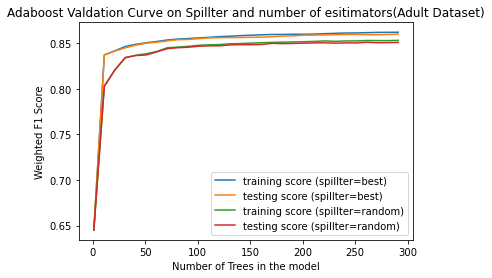

In [27]:

plt.plot(range(1,300,10),np.mean(train_scores_best,axis=1),label='training score (spillter=best)')
plt.plot(range(1,300,10),np.mean(valid_scores_best,axis=1),label='testing score (spillter=best)')
plt.plot(range(1,300,10),np.mean(train_scores_random,axis=1),label='training score (spillter=random)')
plt.plot(range(1,300,10),np.mean(valid_scores_random,axis=1),label='testing score (spillter=random)')
#plt.xlim(0,100)
plt.title('Adaboost Valdation Curve on Spillter and number of esitimators(Adult Dataset)')
plt.xlabel('Number of Trees in the model')
plt.ylabel('Weighted F1 Score')
plt.legend()

Testing  f1 weighted score is 0.842108454494963
Train  f1 weighted score is 0.8407789948829315


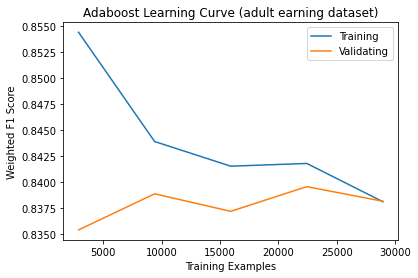

In [32]:
###learning curve adult 
from random import random
from sklearn.ensemble import AdaBoostClassifier
clf = AdaBoostClassifier(base_estimator= DecisionTreeClassifier(random_state=0,max_depth=1,splitter='random'))
train_sizes, train_scores, test_scores, fit_times, _ = learning_curve(clf,X_train_adult,y_train_adult, cv=5,return_times=True,scoring='f1_weighted',random_state=0)

plt.plot(train_sizes,np.mean(train_scores,axis=1),label='Training')
plt.plot(train_sizes,np.mean(test_scores,axis=1),label='Validating')
plt.title('Adaboost Learning Curve (adult earning dataset)')
plt.xlabel('Training Examples')
plt.ylabel('Weighted F1 Score')
plt.legend()


clf.fit(X_train_adult, y_train_adult)
pred_test_adult= clf.predict(X_test_adult)
pred_train_adult =clf.predict(X_train_adult)
print('Testing  f1 weighted score is ' + str(f1_score(y_test_adult,pred_test_adult,average='weighted')))
print('Train  f1 weighted score is ' + str(f1_score(y_train_adult,pred_train_adult,average='weighted')))




In [33]:
clf = AdaBoostClassifier(base_estimator= DecisionTreeClassifier(random_state=0,max_depth=1,splitter='random'))

In [34]:
clf.fit(X_train_adult,y_train_adult)

AdaBoostClassifier(base_estimator=DecisionTreeClassifier(max_depth=1,
                                                         random_state=0,
                                                         splitter='random'))

In [36]:
pred_test=clf.predict(X_test_adult)
pred_train=clf.predict(X_train_adult)
print('Testing  f1 weighted score is ' + str(f1_score(y_test_adult,pred_test,average='weighted')))
print('Train  f1 weighted score is ' + str(f1_score(y_train_adult,pred_train,average='weighted')))


Testing  f1 weighted score is 0.8400288961492116
Train  f1 weighted score is 0.8408178633134895


ValueError: x and y must have same first dimension, but have shapes (5,) and (30,)

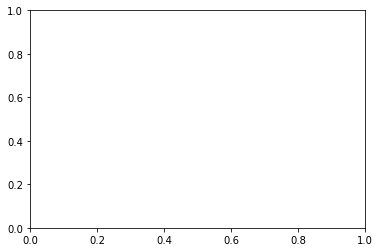

In [40]:
from sklearn.ensemble import AdaBoostClassifier
clf_random = AdaBoostClassifier(base_estimator= DecisionTreeClassifier(random_state=0,max_depth=1,splitter='random'))
clf_best = AdaBoostClassifier(base_estimator= DecisionTreeClassifier(random_state=0,max_depth=1,splitter='best'))

train_scores_best, valid_scores_best = validation_curve(
     AdaBoostClassifier(base_estimator=DecisionTreeClassifier(max_depth=1,splitter='best'),random_state=0), X_train_bean, y_train_bean, param_name='n_estimators', param_range=range(1,300,10),
     cv=5,scoring='f1_weighted')
train_scores_random, valid_scores_random = validation_curve(
     AdaBoostClassifier(base_estimator=DecisionTreeClassifier(max_depth=1,splitter='random'),random_state=0), X_train_bean, y_train_bean, param_name='n_estimators', param_range=range(1,300,10),
     cv=5,scoring='f1_weighted')



Text(0, 0.5, 'Weighted F1 Score')

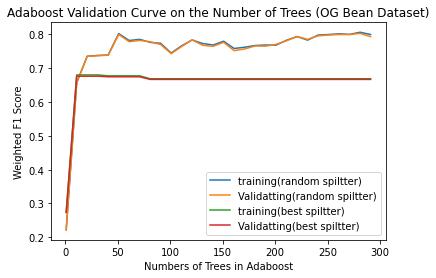

In [41]:
plt.plot(range(1,300,10),np.mean(train_scores_random,axis=1),label='training(random spiltter)')
plt.plot(range(1,300,10),np.mean(valid_scores_random,axis=1),label='Validatting(random spiltter)')
plt.plot(range(1,300,10),np.mean(train_scores_best,axis=1),label='training(best spiltter)')
plt.plot(range(1,300,10),np.mean(valid_scores_best,axis=1),label='Validatting(best spiltter)')
plt.legend()
plt.title('Adaboost Validation Curve on the Number of Trees (OG Bean Dataset)')
plt.xlabel('Numbers of Trees in Adaboost')
plt.ylabel('Weighted F1 Score')


Testing  f1 weighted score is 0.8257134035110799
Train  f1 weighted score is 0.8269460414915468
Testing  f1 weighted score is 0.7022853551153
Train  f1 weighted score is 0.6905455402833293


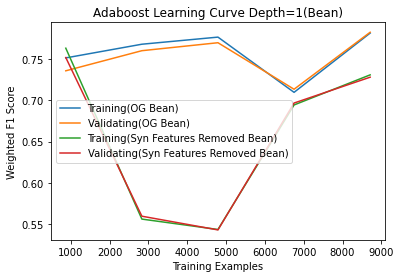

In [75]:
###Learning Curve Bean og vs pure dataset 
clf = AdaBoostClassifier(base_estimator= DecisionTreeClassifier(random_state=0,splitter='random',max_depth=3),n_estimators=50,random_state=0)
train_sizes, train_scores_og, test_scores_og, fit_times, _ = learning_curve(clf,X_train_bean,y_train_bean, cv=5,return_times=True,scoring='f1_weighted',random_state=0)
train_sizes, train_scores_pure, test_scores_pure, fit_times, _ = learning_curve(clf,X_train_bean_pure,y_train_bean, cv=5,return_times=True,scoring='f1_weighted',random_state=0)

plt.plot(train_sizes,np.mean(train_scores_og,axis=1),label='Training(OG Bean)')
plt.plot(train_sizes,np.mean(test_scores_og,axis=1),label='Validating(OG Bean)')
plt.plot(train_sizes,np.mean(train_scores_pure,axis=1),label='Training(Syn Features Removed Bean)')
plt.plot(train_sizes,np.mean(test_scores_pure,axis=1),label='Validating(Syn Features Removed Bean)')
plt.title('Adaboost Learning Curve Depth=1(Bean)')
plt.xlabel('Training Examples')
plt.ylabel('Weighted F1 Score')
plt.legend()


clf.fit(X_train_bean, y_train_bean)
pred_test_bean= clf.predict(X_test_bean)
pred_train_bean =clf.predict(X_train_bean)
print('Testing  f1 weighted score is ' + str(f1_score(y_test_bean,pred_test_bean,average='weighted')))
print('Train  f1 weighted score is ' + str(f1_score(y_train_bean,pred_train_bean,average='weighted')))

clf.fit(X_train_bean_pure, y_train_bean)
pred_test_bean_pure= clf.predict(X_test_bean_pure)
pred_train_bean_pure =clf.predict(X_train_bean_pure)
print('Testing  f1 weighted score is ' + str(f1_score(y_test_bean,pred_test_bean_pure,average='weighted')))
print('Train  f1 weighted score is ' + str(f1_score(y_train_bean,pred_train_bean_pure,average='weighted')))



In [ ]:
clf.fit(X_train_bean, y_train_bean)

In [7]:
from sklearn.model_selection import cross_validate
depth = range(1,10,1)
train_score = []
val_score = []
train_time = []
for i in depth:
     cv_results = cross_validate(AdaBoostClassifier(DecisionTreeClassifier(max_depth=i,random_state=0,splitter='random')), X_train_bean, y_train_bean, cv=5,return_train_score=True,scoring='f1_weighted')
     val_score.append(np.mean(cv_results['test_score']))
     train_score.append(np.mean(cv_results['train_score']))
     train_time.append(np.mean(cv_results['fit_time']))
     


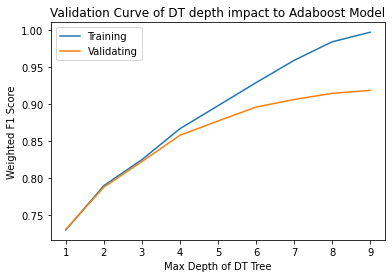

In [10]:
plt.plot(range(1,10,1),train_score,label='Training')
plt.plot(range(1,10,1),val_score,label='Validating')
plt.title('Validation Curve of DT depth impact to Adaboost Model')
plt.xlabel('Max Depth of DT Tree')
plt.ylabel('Weighted F1 Score')
plt.legend()


Testing  f1 weighted score is 0.847922070101057
Train  f1 weighted score is 0.8489456180902643
Testing  f1 weighted score is 0.6046754914453495
Train  f1 weighted score is 0.600748667983492


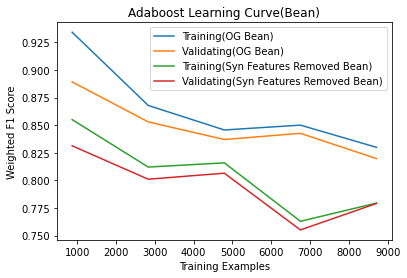

In [15]:
###Learning Curve Bean og vs pure dataset 
clf = AdaBoostClassifier(base_estimator= DecisionTreeClassifier(random_state=0,splitter='random',max_depth=3),n_estimators=50,random_state=0)
train_sizes, train_scores_og, test_scores_og, fit_times, _ = learning_curve(clf,X_train_bean,y_train_bean, cv=5,return_times=True,scoring='f1_weighted',random_state=0)
train_sizes, train_scores_pure, test_scores_pure, fit_times, _ = learning_curve(clf,X_train_bean_pure,y_train_bean, cv=5,return_times=True,scoring='f1_weighted',random_state=0)

plt.plot(train_sizes,np.mean(train_scores_og,axis=1),label='Training(OG Bean)')
plt.plot(train_sizes,np.mean(test_scores_og,axis=1),label='Validating(OG Bean)')
plt.plot(train_sizes,np.mean(train_scores_pure,axis=1),label='Training(Syn Features Removed Bean)')
plt.plot(train_sizes,np.mean(test_scores_pure,axis=1),label='Validating(Syn Features Removed Bean)')
plt.title('Adaboost Learning Curve(Bean)')
plt.xlabel('Training Examples')
plt.ylabel('Weighted F1 Score')
plt.legend()


clf.fit(X_train_bean, y_train_bean)
pred_test_bean= clf.predict(X_test_bean)
pred_train_bean =clf.predict(X_train_bean)
print('Testing  f1 weighted score is ' + str(f1_score(y_test_bean,pred_test_bean,average='weighted')))
print('Train  f1 weighted score is ' + str(f1_score(y_train_bean,pred_train_bean,average='weighted')))

clf.fit(X_train_bean_pure, y_train_bean)
pred_test_bean_pure= clf.predict(X_test_bean_pure)
pred_train_bean_pure =clf.predict(X_train_bean_pure)
print('Testing  f1 weighted score is ' + str(f1_score(y_test_bean,pred_test_bean_pure,average='weighted')))
print('Train  f1 weighted score is ' + str(f1_score(y_train_bean,pred_train_bean_pure,average='weighted')))

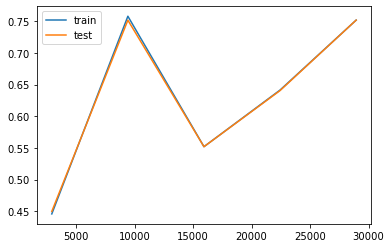

In [55]:
from sklearn.neural_network import MLPClassifier

clf = MLPClassifier(hidden_layer_sizes=(32,32,16),solver='adam',learning_rate_init=1e-3,max_iter=10000,tol=0.0001)
train_sizes, train_scores, test_scores, fit_times, _ = learning_curve(clf, X_train_adult, y_train_adult, cv=5,return_times=True)

plt.plot(train_sizes,np.mean(train_scores,axis=1),label='train')
plt.plot(train_sizes,np.mean(test_scores,axis=1),label='test')
plt.legend()


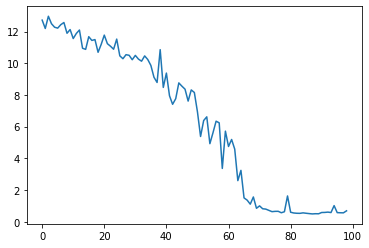

In [54]:
clf.fit(X_train_adult,y_train_adult)
plt.plot(clf.loss_curve_)

In [61]:
from asyncio import constants
from sklearn.metrics import f1_score, make_scorer
mlp = MLPClassifier(max_iter=1000,random_state=0)
parameter_space = {
    'hidden_layer_sizes': [(16,16),(16,16,16),(32,32),(32,32,32),(64,64,64),(64,64),(128,128,128),(16,),(32,),(64,),(128,)],
    'activation': ['relu','sigmoid'],
    'solver': ['adam','sgd'],
    'alpha': [0.0001,0.001],
    'learning_rate': ['adaptive','constants'],
    'learning_rate_init': [0.001,0.01,0.0001]
}

from sklearn.model_selection import GridSearchCV
f1_scorer = make_scorer(f1_score)
clf = GridSearchCV(mlp, parameter_space, n_jobs=-1, cv=5,scoring=f1_scorer)
clf.fit(X_train_adult, y_train_adult)
# Best paramete set
print('Best parameters found:\n', clf.best_params_)

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std * 2, params))

/home/sun/miniconda3/envs/playground/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
1980 fits failed out of a total of 2640.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
660 fits failed with the following error:
Traceback (most recent call last):
  File "/home/sun/miniconda3/envs/playground/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/home/sun/miniconda3/envs/playground/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py", line 762, in fit
    return self._fit(X, y, incremental=False)
  File "/home/sun/miniconda3/envs/playground/lib/python3.10/site-packag

Best parameters found:
 {'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (32,), 'learning_rate': 'adaptive', 'learning_rate_init': 0.01, 'solver': 'adam'}
0.052 (+/-0.091) for {'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (16, 16), 'learning_rate': 'adaptive', 'learning_rate_init': 0.001, 'solver': 'adam'}
0.000 (+/-0.000) for {'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (16, 16), 'learning_rate': 'adaptive', 'learning_rate_init': 0.001, 'solver': 'sgd'}
0.000 (+/-0.000) for {'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (16, 16), 'learning_rate': 'adaptive', 'learning_rate_init': 0.01, 'solver': 'adam'}
0.000 (+/-0.000) for {'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (16, 16), 'learning_rate': 'adaptive', 'learning_rate_init': 0.01, 'solver': 'sgd'}
0.178 (+/-0.376) for {'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (16, 16), 'learning_rate': 'adaptive', 'learning_rate_init': 0.0001, 'solver'

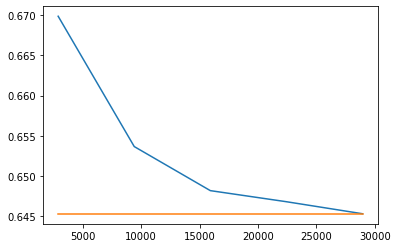

In [2]:
from sklearn.model_selection import learning_curve
from sklearn.svm import SVC
from matplotlib import pyplot as plt
import numpy as np

estimator = SVC(kernel= 'rbf',cache_size=200000)

train_sizes, train_scores, test_scores, fit_times, _ = learning_curve(estimator, X_train_adult, y_train_adult, cv=5,return_times=True,scoring='f1_weighted')

plt.plot(train_sizes,np.mean(train_scores,axis=1))
plt.plot(train_sizes,np.mean(test_scores,axis=1))


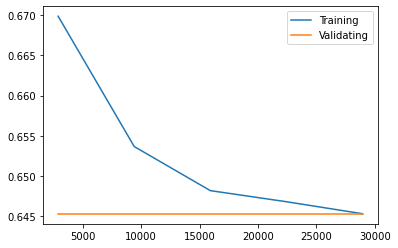

In [4]:
plt.plot(train_sizes,np.mean(train_scores,axis=1),label='Training')
plt.plot(train_sizes,np.mean(test_scores,axis=1),label='Validating')
plt.legend()

In [2]:
from sklearn.utils import resample 

train_adult = X_train_adult.copy()
train_adult['50K'] = y_train_adult
poor = train_adult[train_adult['50K']==0]
rich = train_adult[train_adult['50K']==1]
poor_sample = resample(poor,n_samples = int(train_adult.shape[0]/2))
rich_sample = resample(rich,n_samples = int(train_adult.shape[0]/2))
new_train = pd.concat([poor_sample,rich_sample])
new_train=new_train.sample(frac=1)

X_train_adult_balanced, y_train_adult_balanced = new_train.loc[:, new_train.columns != '50K'],new_train['50K']


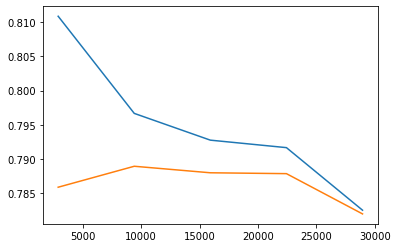

In [69]:
from sklearn.model_selection import learning_curve
from sklearn.svm import SVC
from matplotlib import pyplot as plt
import numpy as np

estimator = SVC(kernel= 'linear',cache_size=200000)

train_sizes, train_scores, test_scores, fit_times, _ = learning_curve(estimator, X_train_adult, y_train_adult, cv=5,return_times=True,scoring='f1_weighted')

plt.plot(train_sizes,np.mean(train_scores,axis=1))
plt.plot(train_sizes,np.mean(test_scores,axis=1))

In [71]:
estimator = SVC(kernel= 'linear',cache_size=200000)

In [72]:
train_sizes, train_scores, test_scores, fit_times, _ = learning_curve(estimator, X_train_adult, y_train_adult, cv=5,return_times=True,scoring='f1_weighted')

In [73]:
estimator = SVC(kernel= 'rbf',cache_size=200000)

In [75]:
estimator.fit(X_train_adult,y_train_adult)


SVC(cache_size=200000)

In [83]:

pred_test = estimator.predict(X_test_adult)


In [84]:
pred_train = estimator.predict(X_train_adult)

In [82]:

print('Testing  f1 weighted score is ' + str(f1_score(y_test_adult,pred_test,average='weighted')))
print('Train  f1 weighted score is ' + str(f1_score(y_train_adult,pred_train,average='weighted')))

Testing  f1 weighted score is 0.8346017845133085
Train  f1 weighted score is 0.8448448132489302


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


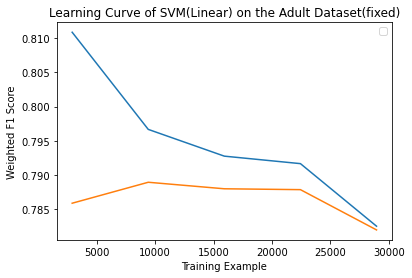

In [70]:
plt.plot(train_sizes,np.mean(train_scores,axis=1))
plt.plot(train_sizes,np.mean(test_scores,axis=1))
plt.title('Learning Curve of SVM(Linear) on the Adult Dataset(fixed)')
plt.ylabel('Weighted F1 Score')
plt.xlabel('Training Example')
plt.legend()

In [ ]:
plt.plot(train_sizes,np.mean(train_scores,axis=1))
plt.plot(train_sizes,np.mean(test_scores,axis=1))

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


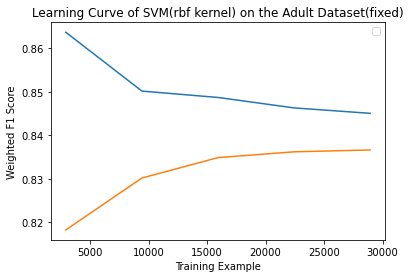

In [61]:
plt.plot(train_sizes,np.mean(train_scores,axis=1))
plt.plot(train_sizes,np.mean(test_scores,axis=1))
plt.title('Learning Curve of SVM(rbf kernel) on the Adult Dataset(fixed)')
plt.ylabel('Weighted F1 Score')
plt.xlabel('Training Example')
plt.legend()

In [66]:
estimator = SVC(kernel= 'rbf',cache_size=200000)
train_sizes, train_scores, test_scores, fit_times, _ = learning_curve(estimator, X_train_adult_balanced, y_train_adult_balanced, cv=5,return_times=True,scoring='f1_weighted')

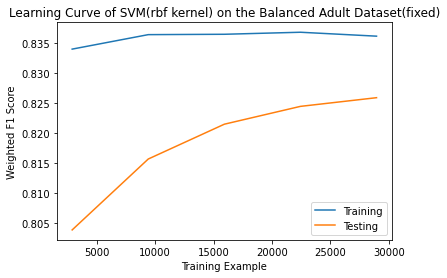

In [68]:
plt.plot(train_sizes,np.mean(train_scores,axis=1),label='Training')
plt.plot(train_sizes,np.mean(test_scores,axis=1),label='Testing')
plt.title('Learning Curve of SVM(rbf kernel) on the Balanced Adult Dataset(fixed)')
plt.ylabel('Weighted F1 Score')
plt.xlabel('Training Example')
plt.legend()

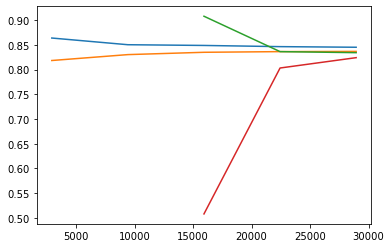

In [55]:
train_sizes, train_scores_bal, test_scores_bal, fit_times, _ = learning_curve(estimator, X_train_adult_balanced, y_adult_balanced,cv=5,return_times=True,scoring='f1_weighted')

plt.plot(train_sizes,np.mean(train_scores,axis=1))
plt.plot(train_sizes,np.mean(test_scores,axis=1))

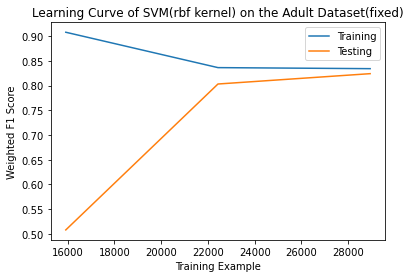

In [57]:
plt.plot(train_sizes,np.mean(train_scores_bal,axis=1),label='Training')
plt.plot(train_sizes,np.mean(test_scores_bal,axis=1),label='Testing')
plt.title('Learning Curve of SVM(rbf kernel) on the Adult Dataset(fixed)')
plt.ylabel('Weighted F1 Score')
plt.xlabel('Training Example')
plt.legend()

Text(0, 0.5, 'Weighted F1 Score')

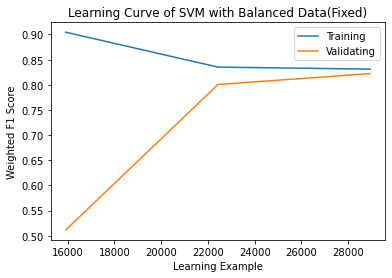

In [50]:
plt.title('Learning Curve of SVM with Balanced Data(Fixed)')
plt.plot(train_sizes,np.mean(train_scores,axis=1),label='Training')
plt.plot(train_sizes,np.mean(test_scores,axis=1),label='Validating')
plt.legend()
plt.xlabel('Learning Example')
plt.ylabel('Weighted F1 Score')


In [2]:

scaler = StandardScaler()
#num_label = ['age','education-num','capital-gain','capital-loss','hours-per-week']
num_label = list(adult_df.columns)
num_label.remove('50K')
adult_df[num_label] = scaler.fit_transform(adult_df[num_label] )
#print(adult_df['hours-per-week'].std())
X_adult, y_adult = adult_df.loc[:, adult_df.columns != '50K'],adult_df['50K']

X_train_adult, X_test_adult, y_train_adult, y_test_adult = train_test_split(X_adult, y_adult, test_size=0.2, random_state=33)

In [137]:
from sklearn.model_selection import learning_curve
from sklearn.svm import SVC
from matplotlib import pyplot as plt
import numpy as np

estimator = SVC(kernel= 'rbf',cache_size=200000)

train_sizes, train_scores_rbf, test_scores_rbf, fit_times, _ = learning_curve(estimator, X_train_bean, y_train_bean, cv=5,return_times=True,scoring='f1_weighted')
'''
plt.plot(train_sizes,np.mean(train_scores,axis=1))
plt.plot(train_sizes,np.mean(test_scores,axis=1))
'''

'\nplt.plot(train_sizes,np.mean(train_scores,axis=1))\nplt.plot(train_sizes,np.mean(test_scores,axis=1))\n'

In [138]:

estimator = SVC(kernel= 'linear',cache_size=200000)

train_sizes, train_scores_linear, test_scores_linear, fit_times, _ = learning_curve(estimator, X_train_bean, y_train_bean, cv=5,return_times=True,scoring='f1_weighted')

Text(0.5, 1.0, 'Learning Curve of different SVM Kernel(Beans Dataset)')

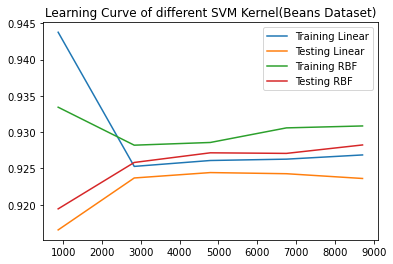

In [88]:
plt.plot(train_sizes,np.mean(train_scores_linear,axis=1),label='Training Linear')
plt.plot(train_sizes,np.mean(test_scores_linear,axis=1),label='Testing Linear')
plt.plot(train_sizes,np.mean(train_scores_rbf,axis=1),label='Training RBF')
plt.plot(train_sizes,np.mean(test_scores_rbf,axis=1),label='Testing RBF')
plt.legend()
plt.title('Learning Curve of different SVM Kernel(Beans Dataset)')

In [139]:

estimator = SVC(kernel= 'rbf',cache_size=200000)

train_sizes_og, train_scores_og, test_scores_og, fit_times_og, _ = learning_curve(estimator, X_train_bean, y_train_bean, cv=5,return_times=True,scoring='f1_weighted')
train_sizes_pure, train_scores_pure, test_scores_pure, fit_times_pure, _ = learning_curve(estimator, X_train_bean_pure, y_train_bean, cv=5,return_times=True,scoring='f1_weighted')


In [145]:
estimator = SVC(kernel= 'rbf',cache_size=200000)

In [146]:
estimator.fit(X_train_bean,y_train_bean)


SVC(cache_size=200000)

In [147]:
estimator.predict(X_test_bean)

array(['SEKER', 'BOMBAY', 'BOMBAY', ..., 'BARBUNYA', 'HOROZ', 'BARBUNYA'],
      dtype=object)

In [12]:
pred_test=estimator.predict(X_test_bean)
pred_train=estimator.predict(X_train_bean)

print('F1 weighted for train ' +str(f1_score(y_train_bean,pred_train,average='weighted')) )
print('F1 weighted for test ' +str(f1_score(y_test_bean,pred_test,average='weighted')) )



F1 weighted for train 0.9317554330648002
F1 weighted for test 0.9346141328385507


Text(0.5, 1.0, 'Learning Curve Syn Features with and without(Bean)')

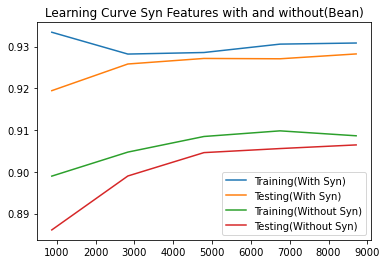

In [8]:
plt.plot(train_sizes_og,np.mean(train_scores_og,axis=1),label='Training(With Syn)')
plt.plot(train_sizes_og,np.mean(test_scores_og,axis=1),label='Testing(With Syn)')
plt.plot(train_sizes_pure,np.mean(train_scores_pure,axis=1),label='Training(Without Syn)')
plt.plot(train_sizes_pure,np.mean(test_scores_pure,axis=1),label='Testing(Without Syn)')
plt.legend()
plt.title('Learning Curve Syn Features with and without(Bean)')

In [ ]:

plt.plot(train_sizes,np.mean(train_scores,axis=1),label='train')
plt.plot(train_sizes,np.mean(test_scores,axis=1),label='test')
plt.legend()

In [ ]:
from sklearn.neural_network import MLPClassifier

clf = MLPClassifier(hidden_layer_sizes=(32,32,16),solver='adam',learning_rate_init=1e-3,max_iter=10000,tol=0.0001)
train_sizes, train_scores, test_scores, fit_times, _ = learning_curve(clf, X_train_adult, y_train_adult, cv=5,return_times=True)

plt.plot(train_sizes,np.mean(train_scores,axis=1),label='train')
plt.plot(train_sizes,np.mean(test_scores,axis=1),label='test')
plt.legend()

In [4]:
from asyncio import constants
from sklearn.metrics import f1_score, make_scorer
from sklearn.neural_network import MLPClassifier
mlp = MLPClassifier(max_iter=1000,random_state=0)
parameter_space = {
    'hidden_layer_sizes': [(8),(8,8),(8,8,8),(16),(16,16),(16,16,16),(32),(32,32),(32,32,32),(32,32,32,32)],
    'activation': ['relu'],
    'solver': ['sgd','adam'],
    'learning_rate_init': [0.001,0.01,0.0001]
}

from sklearn.model_selection import GridSearchCV
f1_scorer = make_scorer(f1_score, average='weighted')
clf = GridSearchCV(mlp, parameter_space, n_jobs=-1, cv=5,scoring=f1_scorer)
clf.fit(X_train_adult, y_train_adult)
# Best paramete set
print('Best parameters found:\n', clf.best_params_)

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std * 2, params))

Best parameters found:
 {'activation': 'relu', 'hidden_layer_sizes': 32, 'learning_rate_init': 0.01, 'solver': 'adam'}
0.835 (+/-0.006) for {'activation': 'relu', 'hidden_layer_sizes': 8, 'learning_rate_init': 0.001, 'solver': 'sgd'}
0.838 (+/-0.007) for {'activation': 'relu', 'hidden_layer_sizes': 8, 'learning_rate_init': 0.001, 'solver': 'adam'}
0.837 (+/-0.006) for {'activation': 'relu', 'hidden_layer_sizes': 8, 'learning_rate_init': 0.01, 'solver': 'sgd'}
0.839 (+/-0.007) for {'activation': 'relu', 'hidden_layer_sizes': 8, 'learning_rate_init': 0.01, 'solver': 'adam'}
0.821 (+/-0.013) for {'activation': 'relu', 'hidden_layer_sizes': 8, 'learning_rate_init': 0.0001, 'solver': 'sgd'}
0.833 (+/-0.008) for {'activation': 'relu', 'hidden_layer_sizes': 8, 'learning_rate_init': 0.0001, 'solver': 'adam'}
0.837 (+/-0.007) for {'activation': 'relu', 'hidden_layer_sizes': (8, 8), 'learning_rate_init': 0.001, 'solver': 'sgd'}
0.841 (+/-0.006) for {'activation': 'relu', 'hidden_layer_sizes': (8

In [5]:
from asyncio import constants
from sklearn.metrics import f1_score, make_scorer
from sklearn.neural_network import MLPClassifier
mlp = MLPClassifier(max_iter=1000,random_state=0)
parameter_space = {
    'hidden_layer_sizes': [(8),(8,8),(8,8,8),(16),(16,16),(16,16,16),(32),(32,32),(32,32,32),(32,32,32,32)],
    'activation': ['relu'],
    'solver': ['sgd','adam'],
    'learning_rate_init': [0.001,0.01,0.0001]
}

from sklearn.model_selection import GridSearchCV
f1_scorer = make_scorer(f1_score, average='weighted')
clf = GridSearchCV(mlp, parameter_space, n_jobs=-1, cv=5,scoring=f1_scorer)
clf.fit(X_train_bean, y_train_bean)
# Best paramete set
print('Best parameters found:\n', clf.best_params_)

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std * 2, params))

Best parameters found:
 {'activation': 'relu', 'hidden_layer_sizes': (32, 32), 'learning_rate_init': 0.001, 'solver': 'adam'}
0.921 (+/-0.004) for {'activation': 'relu', 'hidden_layer_sizes': 8, 'learning_rate_init': 0.001, 'solver': 'sgd'}
0.925 (+/-0.004) for {'activation': 'relu', 'hidden_layer_sizes': 8, 'learning_rate_init': 0.001, 'solver': 'adam'}
0.926 (+/-0.006) for {'activation': 'relu', 'hidden_layer_sizes': 8, 'learning_rate_init': 0.01, 'solver': 'sgd'}
0.926 (+/-0.006) for {'activation': 'relu', 'hidden_layer_sizes': 8, 'learning_rate_init': 0.01, 'solver': 'adam'}
0.911 (+/-0.004) for {'activation': 'relu', 'hidden_layer_sizes': 8, 'learning_rate_init': 0.0001, 'solver': 'sgd'}
0.919 (+/-0.003) for {'activation': 'relu', 'hidden_layer_sizes': 8, 'learning_rate_init': 0.0001, 'solver': 'adam'}
0.923 (+/-0.005) for {'activation': 'relu', 'hidden_layer_sizes': (8, 8), 'learning_rate_init': 0.001, 'solver': 'sgd'}
0.925 (+/-0.005) for {'activation': 'relu', 'hidden_layer_siz

In [64]:
from sklearn.model_selection import validation_curve
param_range = [(8),(16),(32),(8,8),(16,16),(32,32),(8,8,8),(16,16,16),(32,32,32),(32,32,32,32)]
train_scores, test_scores = validation_curve(
    MLPClassifier(random_state=0,solver='adam',learning_rate_init=0.001,max_iter=5000,activation='relu',early_stopping=True,validation_fraction=0.1),
    X_train_adult,
    y_train_adult,
    param_name="hidden_layer_sizes",
    param_range=param_range,
    scoring="f1_weighted",
    n_jobs=20,
    cv=5,
)


/home/sun/miniconda3/envs/playground/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(
/home/sun/miniconda3/envs/playground/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(
/home/sun/miniconda3/envs/playground/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(
/home/sun/miniconda3/envs/playground/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(
/home/sun/miniconda3/envs/playground/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warni

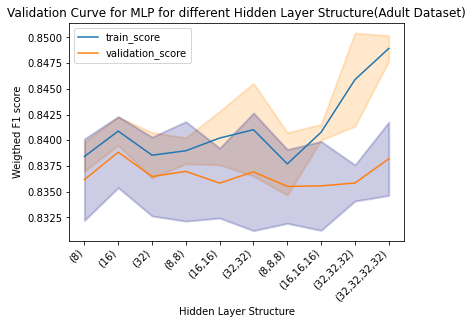

In [65]:
train_scores_mean = np.mean(train_scores, axis=1)
train_scores_std = np.std(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)
test_scores_std = np.std(test_scores, axis=1)

ticker= ['(8)','(16)','(32)','(8,8)','(16,16)','(32,32)','(8,8,8)','(16,16,16)','(32,32,32)','(32,32,32,32)']
plt.xticks(range(10),ticker)
plt.plot(train_scores_mean,label='train_score')
plt.fill_between(
    range(10),
    train_scores_mean - train_scores_std,
    train_scores_mean + train_scores_std,
    alpha=0.2,
    color="darkorange",
    lw=2,
)
plt.plot(test_scores_mean,label='validation_score')
plt.fill_between(
    range(10),
    test_scores_mean - test_scores_std,
    test_scores_mean + test_scores_std,
    alpha=0.2,
    color="navy",
    lw=2,
)
plt.xticks(rotation=45, ha='right')
plt.ylabel('Weigthed F1 score')
plt.xlabel('Hidden Layer Structure')
plt.title('Validation Curve for MLP for different Hidden Layer Structure(Adult Dataset)')

plt.legend()


/home/sun/miniconda3/envs/playground/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(
/home/sun/miniconda3/envs/playground/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(
/home/sun/miniconda3/envs/playground/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(
/home/sun/miniconda3/envs/playground/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(
/home/sun/miniconda3/envs/playground/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warni

Text(0, 0.5, 'Loss')

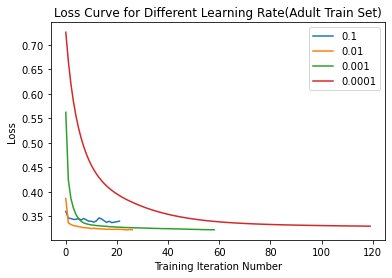

In [77]:
l_rate = [0.1,0.01,0.001,0.0001]
for rate in l_rate:
    clf=MLPClassifier(random_state=0,solver='adam',learning_rate_init=rate,max_iter=5000,activation='relu',hidden_layer_sizes=(16),early_stopping=True,validation_fraction=0.1)
    clf.fit(X_train_adult,y_train_adult)
    plt.plot(clf.loss_curve_,label=str(rate))
    #plt.plot(clf.validation_scores_,label='Validation ' + str(rate))
plt.legend()
plt.title('Loss Curve for Different Learning Rate(Adult Train Set)')
plt.xlabel('Training Iteration Number')
plt.ylabel('Loss')



/home/sun/miniconda3/envs/playground/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(
/home/sun/miniconda3/envs/playground/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(
/home/sun/miniconda3/envs/playground/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(
/home/sun/miniconda3/envs/playground/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(
/home/sun/miniconda3/envs/playground/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warni

The f1 micro score is 0.8413341363912696


/home/sun/miniconda3/envs/playground/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(
/home/sun/miniconda3/envs/playground/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(
/home/sun/miniconda3/envs/playground/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(


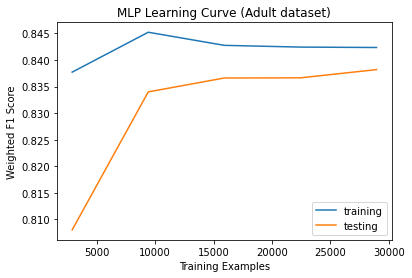

In [78]:

from sklearn.model_selection import learning_curve
clf=MLPClassifier(random_state=0,solver='adam',learning_rate_init=0.01,max_iter=5000,activation='relu',hidden_layer_sizes=(16),early_stopping=True,validation_fraction=0.1)
train_sizes, train_scores, test_scores, fit_times, _ = learning_curve(clf, X_train_adult, y_train_adult, cv=5,return_times=True,scoring='f1_weighted')

plt.plot(train_sizes,np.mean(train_scores,axis=1),label='training')
plt.plot(train_sizes,np.mean(test_scores,axis=1),label='testing')
plt.title('MLP Learning Curve (Adult dataset)')
plt.xlabel('Training Examples')
plt.ylabel('Weighted F1 Score')
plt.legend()
clf.fit(X_train_adult, y_train_adult)
pred_test_adult = clf.predict(X_test_adult)
print('The f1 micro score is ' + str(f1_score(y_test_adult,pred_test_adult,average='weighted')))

In [79]:
pred_train_adult = clf.predict(X_train_adult)
print('The f1 micro score is ' + str(f1_score(y_train_adult,pred_train_adult,average='weighted')))

The f1 micro score is 0.8427056080981165


In [80]:
pred_test_adult = clf.predict(X_test_adult)
print('The f1 micro score is ' + str(f1_score(y_test_adult,pred_test_adult,average='weighted')))

The f1 micro score is 0.8413341363912696


In [81]:
clf=MLPClassifier(random_state=0,solver='adam',learning_rate_init=0.01,max_iter=5000,activation='relu',hidden_layer_sizes=(32))

In [82]:
clf.fit(X_train_adult, y_train_adult)

MLPClassifier(hidden_layer_sizes=32, learning_rate_init=0.01, max_iter=5000,
              random_state=0)

In [73]:
from sklearn.model_selection import validation_curve
param_range = [(8),(16),(32),(8,8),(16,16),(32,8),(32,16),(32,32),(8,8,8),(16,16,16),(32,32,32),(32,32,32,32)]
train_scores, test_scores = validation_curve(
    MLPClassifier(random_state=0,solver='adam',learning_rate_init=0.001,max_iter=5000,activation='relu',early_stopping=True,validation_fraction=0.1),
    X_train_bean,
    y_train_bean,
    param_name="hidden_layer_sizes",
    param_range=param_range,
    scoring="f1_weighted",
    n_jobs=20,
    cv=5,
)

/home/sun/miniconda3/envs/playground/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(
/home/sun/miniconda3/envs/playground/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(
/home/sun/miniconda3/envs/playground/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(
/home/sun/miniconda3/envs/playground/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(
/home/sun/miniconda3/envs/playground/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warni

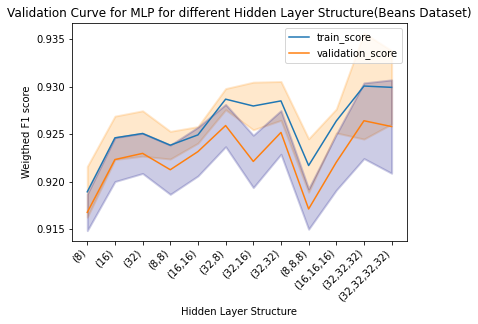

In [75]:
train_scores_mean = np.mean(train_scores, axis=1)
train_scores_std = np.std(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)
test_scores_std = np.std(test_scores, axis=1)

ticker= ['(8)','(16)','(32)','(8,8)','(16,16)','(32,8)','(32,16)','(32,32)','(8,8,8)','(16,16,16)','(32,32,32)','(32,32,32,32)']
plt.xticks(range(12),ticker)
plt.plot(train_scores_mean,label='train_score')
plt.fill_between(
    range(12),
    train_scores_mean - train_scores_std,
    train_scores_mean + train_scores_std,
    alpha=0.2,
    color="darkorange",
    lw=2,
)
plt.plot(test_scores_mean,label='validation_score')
plt.fill_between(
    range(12),
    test_scores_mean - test_scores_std,
    test_scores_mean + test_scores_std,
    alpha=0.2,
    color="navy",
    lw=2,
)
plt.xticks(rotation=45, ha='right')
plt.ylabel('Weigthed F1 score')
plt.xlabel('Hidden Layer Structure')
plt.title('Validation Curve for MLP for different Hidden Layer Structure(Beans Dataset)')

plt.legend()


/home/sun/miniconda3/envs/playground/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(
/home/sun/miniconda3/envs/playground/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(
/home/sun/miniconda3/envs/playground/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(
/home/sun/miniconda3/envs/playground/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(
/home/sun/miniconda3/envs/playground/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warni

Text(0, 0.5, 'Loss')

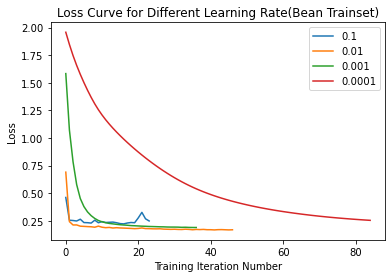

In [83]:
l_rate = [0.1,0.01,0.001,0.0001]
for rate in l_rate:
    clf=MLPClassifier(random_state=0,solver='adam',learning_rate_init=rate,max_iter=5000,activation='relu',hidden_layer_sizes=(32,8),early_stopping=True,validation_fraction=0.1)
    clf.fit(X_train_bean,y_train_bean)
    plt.plot(clf.loss_curve_,label=str(rate))
    #plt.plot(clf.validation_scores_,label='Validation ' + str(rate))
plt.legend()
plt.title('Loss Curve for Different Learning Rate(Bean Trainset)')
plt.xlabel('Training Iteration Number')
plt.ylabel('Loss')

/home/sun/miniconda3/envs/playground/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(
/home/sun/miniconda3/envs/playground/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(
/home/sun/miniconda3/envs/playground/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(
/home/sun/miniconda3/envs/playground/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(
/home/sun/miniconda3/envs/playground/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warni

The f1 micro score is 0.8432691346128406


/home/sun/miniconda3/envs/playground/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(
/home/sun/miniconda3/envs/playground/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(
/home/sun/miniconda3/envs/playground/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(


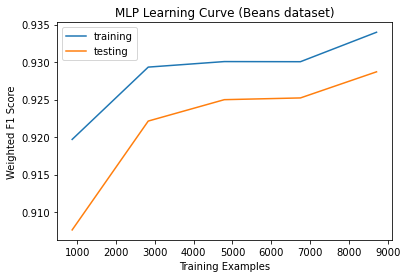

In [84]:

from sklearn.model_selection import learning_curve
clf=MLPClassifier(random_state=0,solver='adam',learning_rate_init=0.01,max_iter=5000,activation='relu',hidden_layer_sizes=(32,8),early_stopping=True,validation_fraction=0.1)
train_sizes, train_scores, test_scores, fit_times, _ = learning_curve(clf, X_train_bean, y_train_bean, cv=5,return_times=True,scoring='f1_weighted')

plt.plot(train_sizes,np.mean(train_scores,axis=1),label='training')
plt.plot(train_sizes,np.mean(test_scores,axis=1),label='testing')
plt.title('MLP Learning Curve (Beans dataset)')
plt.xlabel('Training Examples')
plt.ylabel('Weighted F1 Score')
plt.legend()

/home/sun/miniconda3/envs/playground/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(
/home/sun/miniconda3/envs/playground/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(
/home/sun/miniconda3/envs/playground/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(
/home/sun/miniconda3/envs/playground/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(
/home/sun/miniconda3/envs/playground/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warni

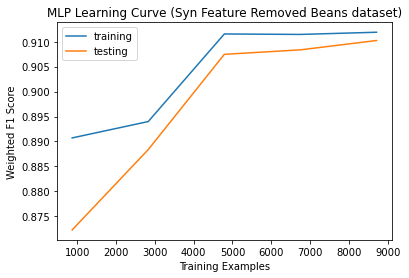

In [85]:

from sklearn.model_selection import learning_curve
clf=MLPClassifier(random_state=0,solver='adam',learning_rate_init=0.01,max_iter=5000,activation='relu',hidden_layer_sizes=(25,8),early_stopping=True,validation_fraction=0.1)
train_sizes, train_scores, test_scores, fit_times, _ = learning_curve(clf, X_train_bean_pure, y_train_bean, cv=5,return_times=True,scoring='f1_weighted')

plt.plot(train_sizes,np.mean(train_scores,axis=1),label='training')
plt.plot(train_sizes,np.mean(test_scores,axis=1),label='testing')
plt.title('MLP Learning Curve (Syn Feature Removed Beans dataset)')
plt.xlabel('Training Examples')
plt.ylabel('Weighted F1 Score')
plt.legend()

/home/sun/miniconda3/envs/playground/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(
/home/sun/miniconda3/envs/playground/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(
/home/sun/miniconda3/envs/playground/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(
/home/sun/miniconda3/envs/playground/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(
/home/sun/miniconda3/envs/playground/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warni

Text(0, 0.5, 'Loss')

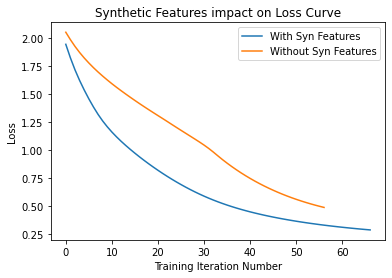

In [86]:

clf=MLPClassifier(random_state=0,solver='adam',learning_rate_init=rate,max_iter=5000,activation='relu',hidden_layer_sizes=(32,8),early_stopping=True,validation_fraction=0.01)
clf.fit(X_train_bean,y_train_bean)
plt.plot(clf.loss_curve_,label='With Syn Features')
clf.fit(X_train_bean_pure,y_train_bean)
plt.plot(clf.loss_curve_,label='Without Syn Features')
#plt.plot(clf.validation_scores_,label='Validation ' + str(rate))
plt.legend()
plt.title('Synthetic Features impact on Loss Curve')
plt.xlabel('Training Iteration Number')
plt.ylabel('Loss')

/home/sun/miniconda3/envs/playground/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(
/home/sun/miniconda3/envs/playground/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(
/home/sun/miniconda3/envs/playground/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(
/home/sun/miniconda3/envs/playground/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(
/home/sun/miniconda3/envs/playground/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warni

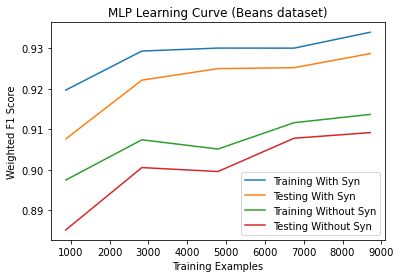

In [87]:

from sklearn.model_selection import learning_curve
clf=MLPClassifier(random_state=0,solver='adam',learning_rate_init=0.01,max_iter=5000,activation='relu',hidden_layer_sizes=(32,8),early_stopping=True,validation_fraction=0.1)
train_sizes, train_scores, test_scores, fit_times, _ = learning_curve(clf, X_train_bean, y_train_bean, cv=5,return_times=True,scoring='f1_weighted')

plt.plot(train_sizes,np.mean(train_scores,axis=1),label='Training With Syn')
plt.plot(train_sizes,np.mean(test_scores,axis=1),label='Testing With Syn')
train_sizes, train_scores, test_scores, fit_times, _ = learning_curve(clf, X_train_bean_pure, y_train_bean, cv=5,return_times=True,scoring='f1_weighted')

plt.plot(train_sizes,np.mean(train_scores,axis=1),label='Training Without Syn')
plt.plot(train_sizes,np.mean(test_scores,axis=1),label='Testing Without Syn')
plt.title('MLP Learning Curve (Beans dataset)')
plt.xlabel('Training Examples')
plt.ylabel('Weighted F1 Score')
plt.legend()
#clf.fit(X_train_adult, y_train_adult)
#pred_test_adult = clf.predict(X_test_adult)
#print('The f1 micro score is ' + str(f1_score(y_test_adult,pred_test_adult,average='weighted')))

In [88]:
clf=MLPClassifier(random_state=0,solver='adam',learning_rate_init=0.01,max_iter=5000,activation='relu',hidden_layer_sizes=(32,8),early_stopping=True,validation_fraction=0.1)


In [89]:
clf.fit(X_train_bean,y_train_bean)

/home/sun/miniconda3/envs/playground/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(
/home/sun/miniconda3/envs/playground/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(
/home/sun/miniconda3/envs/playground/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(
/home/sun/miniconda3/envs/playground/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(
/home/sun/miniconda3/envs/playground/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warni

MLPClassifier(early_stopping=True, hidden_layer_sizes=(32, 8),
              learning_rate_init=0.01, max_iter=5000, random_state=0)

In [90]:
clf.predict(X_test_bean)

array(['SEKER', 'BOMBAY', 'BOMBAY', ..., 'BARBUNYA', 'HOROZ', 'BARBUNYA'],
      dtype='<U8')

In [91]:
pred_train_bean = clf.predict(X_train_bean)
print('The train f1 micro score is ' + str(f1_score(y_train_bean,pred_train_bean,average='weighted')))
pred_test_bean = clf.predict(X_test_bean)
print('The test f1 micro score is ' + str(f1_score(y_test_bean,pred_test_bean,average='weighted')))

The train f1 micro score is 0.9359695304160706
The test f1 micro score is 0.9305903911462445
